# **Countrywise Life Expectancy + Risks Exploratory Data Analysis**

###**Descriptions of Fields**

**Part 1 : Obtained from 'Life Expectancy' dataset (WHO)**
(https://www.kaggle.com/kumarajarshi/life-expectancy-who)

- country (Nominal) : Name of the country corresponding indicators are for
- year (Ordinal) : Year the indicators were recorded (range: 2000 to 2015 -- 16 years)
- status (Nominal) : A country is categorised as 'Developed' or 'Developing' as per WHO metrics
- life_expectancy (Ratio) : Life expectancy (in years) for people in a particular country (for a given year)
- adult_mortality (Ratio) : Adult mortality rate (ages 15-60) per 1000 people
- infant_deaths (Ratio) : number of infant deaths per 1000 infants
- alcohol (Ratio) : Alcohol consumption rate of country, recorded per capita consumption (in litres of pure alcohol)
- percentage_expenditure (Ratio) : Expenditure on health as % of country's GDP per capita
- hepatitis_b (Ratio) : Percentage of 1 year olds with Hepatitis B immunization
- measles (Ratio) : # of (reported) cases of Measles per 1000 population
- bmi (Interval/Ordinal) : Average BMI (Body Mass Index) of country's population
- under-five_deaths (Ratio) : # of deaths of children under the age of 5, per 1000 population
- polio (Ratio) : Percentage of 1 year olds with Polio immunization
- total_expenditure (Ratio) : Percentage of total government expenditure towards Health
- diphtheria (Ratio) - Percentage of 1 year olds with Diphtheria tetanus toxoid and pertussis (DTP3) immunization  
- hiv/aids (Ratio) - deaths per 1000 live births caused by HIV/AIDS for children under 5
- gdp (Ratio) - Gross Domestic Product per capita (USD)
- population (Ratio) - Population of a country
- thinness_10-19_years (Ratio) - rate of thinness among people aged 10-19 
- thinness_5-9_years (Ratio) - rate of thinness among children aged 5-9
- income_composition_of_resources (Ratio) - Human Development Index in terms of income composition of resources (index ranging from 0 to 1)
- schooling (Ratio) - Average number of years of schooling of country's population

<br/>

**Part 2 : Obtained from 'Worldwide deaths by country/risk factors' dataset (WHO)**
(https://www.kaggle.com/varpit94/worldwide-deaths-by-risk-factors)

- Unsafe water source : Total annual number of deaths due to unsafe water source
- Unsafe sanitation : Total annual number of deaths due to unsafe sanitation
```remaining fields follow same trend: annual number of deaths due to <insert risk factor> -- description to-be-continued...```


*(Note: thinness_1-19_years is incorrectly named; must be renamed to thinness_10-19_years)*

### Life expectancy : Statistical measure of number of years an average human is expected to live; mathematically elegant!

### Is Life expectancy measure of choice in aetiological research / identifying risk factors of death? 
From correlation matrix: No
<br/>
Reason: Life Expectancy is a good measure of public health indicators, but estimations of LE are not straightforward since it is standardised against different age distributions; the translation of changes in age-specific mortality into change in remaining Life expectancy will depend on the level and the distribution of mortality in the population

## Data Download, Merging

In [ ]:
pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od
download_url_lifeExpectancy = 'https://www.kaggle.com/kumarajarshi/life-expectancy-who'
download_url_risks = 'https://www.kaggle.com/varpit94/worldwide-deaths-by-risk-factors'

od.download(download_url_lifeExpectancy)
od.download(download_url_risks)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: aanchalnarendran
Your Kaggle Key: ··········


100%|██████████| 119k/119k [00:00<00:00, 29.0MB/s]


Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: 

aanchalnarendran
Your Kaggle Key: ··········


100%|██████████| 1.04M/1.04M [00:00<00:00, 81.2MB/s]

In [ ]:
lifeExpectancy_fileName = './life-expectancy-who/Life Expectancy Data.csv'
risks_fileName = './worldwide-deaths-by-risk-factors/number-of-deaths-by-risk-factor.csv'

## Data Preparation, Cleaning

1. Load both datasets using Pandas
2. Merge the datasets
3. Fix any missing or incorrect values
- How much numeric data do we have?

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
lifeExpectancy_df = pd.read_csv(lifeExpectancy_fileName)
risks_df = pd.read_csv(risks_fileName)
lifeExpectancy_df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


Merging the datasets

In [ ]:
df = pd.merge(lifeExpectancy_df,risks_df, left_on=["Country","Year"], right_on=["Entity","Year"]).drop('Entity',axis=1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2594 entries, 0 to 2593
Data columns (total 51 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Country                                   2594 non-null   object 
 1   Year                                      2594 non-null   int64  
 2   Status                                    2594 non-null   object 
 3   Life expectancy                           2592 non-null   float64
 4   Adult Mortality                           2592 non-null   float64
 5   infant deaths                             2594 non-null   int64  
 6   Alcohol                                   2421 non-null   float64
 7   percentage expenditure                    2594 non-null   float64
 8   Hepatitis B                               2092 non-null   float64
 9   Measles                                   2594 non-null   int64  
 10   BMI                                

In [ ]:
df.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling,Unsafe water source,Unsafe sanitation,No access to handwashing facility,Household air pollution from solid fuels,Non-exclusive breastfeeding,Discontinued breastfeeding,Child wasting,Child stunting,Low birth weight for gestation,Secondhand smoke,Alcohol use,Drug use,Diet low in fruits,Diet low in vegetables,Unsafe sex,Low physical activity,High fasting plasma glucose,High total cholesterol,High body-mass index,High systolic blood pressure,Smoking,Iron deficiency,Vitamin A deficiency,Low bone mineral density,Air pollution,Outdoor air pollution,Diet high in sodium,Diet low in whole grains,Diet low in nuts and seeds
count,2594.000000,2592.000000,2592.000000,2594.000000,2421.000000,2594.000000,2092.000000,2594.000000,2562.000000,2594.000000,2577.000000,2404.000000,2577.000000,2594.000000,2399.000000,2.204000e+03,2562.000000,2562.000000,2561.000000,2562.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,648.000000,2594.000000,2.594000e+03,2.594000e+03,2594.000000,2594.000000,2594.000000,2.594000e+03,2.594000e+03,2.594000e+03,2594.000000,2594.000000
mean,2007.504241,69.317554,163.900077,30.936777,4.647109,822.845334,81.027247,2315.411334,38.606987,43.008867,82.452852,5.908049,82.618937,1.669237,7554.093394,1.273630e+07,4.806753,4.838134,0.627909,12.001366,8782.996135,6375.448514,5085.638969,11278.783220,1468.546164,95.320970,10121.067520,2679.560003,8192.350449,6175.786391,13005.468202,2082.789232,11660.658228,7133.059341,8218.505706,5001.610264,26002.768601,17829.955454,16685.883768,4.376735e+04,3.275525e+04,497.923030,2641.205700,1296.485551,2.568389e+04,1.525823e+04,1.416482e+04,13442.422907,8794.024937
std,4.611412,9.570416,124.353841,124.083555,4.092943,2096.688974,24.960681,10886.460858,19.921293,168.702668,23.543673,2.357749,23.483837,4.560133,14406.633629,6.172264e+07,4.469820,4.553659,0.214279,3.438172,53441.249997,39320.287689,27367.970161,54883.996996,6079.616766,389.946097,42483.111177,13077.968303,33417.551178,31843.286763,56740.888209,8883.325901,57898.387312,29193.365538,27079.333140,17797.821062,84239.209332,63520.704958,51313.245431,1.783114e+05,1.568866e+05,2620.296488,12180.022512,6506.138623,1.274432e+05,8.284735e+04,1.004244e+05,57306.509605,33453.498590
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,1.400000,0.000000,3.000000,1.100000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000,0.038591,0.045326,0.476952,0.021216,0.066042,0.002848,0.634423,0.016245,1.947360,5.208804,-254.672153,2.703863,5.173118,0.776438,5.230744,9.585234,55.420550,26.852659,41.791707,7.995287e+01,2.973595e+01,0.018049,0.026281,0.478305,2.849307e+01,8.270000e+00,1.041593e+01,24.370348,19.114424
25%,2004.000000,63.000000,72.000000,0.000000,0.850000,13.322781,77.000000,0.000000,19.500000,0.000000,77.000000,4.260000,78.000000,0.100000,462.502219,2.148080e+05,1.600000,1.600000,0.486000,10.000000,8.888900,4.378088,14.923870,75.185795,3.802653,0.218983,33.577722,1.334932,125.602948,257.485513,347.379924,107.548893,491.103356,362.383566,138.220138,249.075032,2029.986338,833.110013,1188.640410,2.434114e+03,1.268413e+03,1.871014,1.493423,39.752476,9.652181e+02,5.460550e+02,3.703645e+02,759.714507,531.435365
50%,2008.000000,72.200000,143.500000,3.000000,3.850000,89.464230,92.000000,14.500000,44.050000,3.000000,93.000000,5.800000,93.000000,0.100000,1774.336730,1.428540e+06,3.300000,3.300000,0.683000,12.400000,128.119656,80.032544,149.073047,753.235819,45.485091,2.853525,334.968901,35.169743,672.243553,860.481103,2054.493348,359.630343,1920.972432,1341.416097,664.282702,875.70

In [ ]:
original_columns = list(df.columns)
updated_col_names = []
for colName in list(df.columns):
    updated_col_names.append(colName.strip().replace('  ',' ').replace(' ', '_').lower())
df.columns = updated_col_names
df

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling,unsafe_water_source,unsafe_sanitation,no_access_to_handwashing_facility,household_air_pollution_from_solid_fuels,non-exclusive_breastfeeding,discontinued_breastfeeding,child_wasting,child_stunting,low_birth_weight_for_gestation,secondhand_smoke,alcohol_use,drug_use,diet_low_in_fruits,diet_low_in_vegetables,unsafe_sex,low_physical_activity,high_fasting_plasma_glucose,high_total_cholesterol,high_body-mass_index,high_systolic_blood_pressure,smoking,iron_deficiency,vitamin_a_deficiency,low_bone_mineral_density,air_pollution,outdoor_air_pollution,diet_high_in_sodium,diet_low_in_whole_grains,diet_low_in_nuts_and_seeds
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,5300.424440,3843.622727,4231.835720,19462.377450,2541.753356,91.689134,15344.889660,5617.862180,17281.751610,5345.589986,598.135706,792.955074,10786.484900,9221.649148,752.450801,4827.338587,26402.061610,NaN,18117.335580,32163.22748,8683.697759,1065.783979,5033.485922,434.828046,26033.718410,6780.26,3316.445516,14242.305350,8687.274664
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,5533.135738,4048.986437,4391.708269,20044.816340,2620.398334,94.467087,15825.362250,5705.569147,17395.489320,5353.132167,570.666516,765.879067,10700.498330,9131.222067,734.881109,4794.894802,26059.742110,NaN,17616.695850,31880.46954,8488.531529,1104.609311,4940.224678,425.964780,26251.144600,6414.25,3272.323115,14065.398290,8583.175662
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,5649.755736,4166.686083,4474.557454,20236.442780,2644.288520,95.121839,16308.282170,6032.637077,17068.947200,5330.222402,540.692298,735.231190,10583.631710,9043.681610,718.029425,4760.525271,25696.026750,NaN,17033.616280,31572.44542,8309.869419,1134.042444,5210.263059,421.347745,26468.199310,6438.87,3214.655896,13860.627410,8507.319690
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,5613.053154,4170.828020,4449.080788,20260.869270,2642.066131,92.586649,16980.380110,6948.652169,17014.683900,5263.410946,511.881632,702.872818,10513.740740,8974.646337,698.603721,4732.985469,25391.278580,NaN,16439.941720,31361.54528,8156.920612,1161.643271,6431.888593,413.903423,26529.230520,6475.42,3152.690488,13698.734900,8454.321712
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,6023.629124,4507.041694,4725.821542,20955.695800,2734.032895,100.096919,17867.741130,7198.097615,17243.037000,5321.617852,481.486925,677.004424,10506.040390,8960.346938,684.864269,4726.158713,25227.550320,NaN,15899.055080,31297.39118,8046.937583,1202.670796,6435.464674,409.034725,27174.744310,6425.95,3097.710300,13614.033650,8452.451444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2589,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2,3255.577440,2244.423005,3137.049906,7198.106549,760.532604,41.390068,6283.514739,1236.981665,5243.717314,1940.845619,8063.239824,2309.431313,3588.832502,2803.991476,90411.608890,890.165557,10624.746660,NaN,5614.121480,11999.71198,9996.875992,523.400146,1350.758563,264.095644,9265.589396,2150.02,1182.667926,2846.835542,2566.348230
2590,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.0

BMI range: 12 to 50?

In [ ]:
df.describe()

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling,unsafe_water_source,unsafe_sanitation,no_access_to_handwashing_facility,household_air_pollution_from_solid_fuels,non-exclusive_breastfeeding,discontinued_breastfeeding,child_wasting,child_stunting,low_birth_weight_for_gestation,secondhand_smoke,alcohol_use,drug_use,diet_low_in_fruits,diet_low_in_vegetables,unsafe_sex,low_physical_activity,high_fasting_plasma_glucose,high_total_cholesterol,high_body-mass_index,high_systolic_blood_pressure,smoking,iron_deficiency,vitamin_a_deficiency,low_bone_mineral_density,air_pollution,outdoor_air_pollution,diet_high_in_sodium,diet_low_in_whole_grains,diet_low_in_nuts_and_seeds
count,2594.000000,2592.000000,2592.000000,2594.000000,2421.000000,2594.000000,2092.000000,2594.000000,2562.000000,2594.000000,2577.000000,2404.000000,2577.000000,2594.000000,2399.000000,2.204000e+03,2562.000000,2562.000000,2561.000000,2562.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,648.000000,2594.000000,2.594000e+03,2.594000e+03,2594.000000,2594.000000,2594.000000,2.594000e+03,2.594000e+03,2.594000e+03,2594.000000,2594.000000
mean,2007.504241,69.317554,163.900077,30.936777,4.647109,822.845334,81.027247,2315.411334,38.606987,43.008867,82.452852,5.908049,82.618937,1.669237,7554.093394,1.273630e+07,4.806753,4.838134,0.627909,12.001366,8782.996135,6375.448514,5085.638969,11278.783220,1468.546164,95.320970,10121.067520,2679.560003,8192.350449,6175.786391,13005.468202,2082.789232,11660.658228,7133.059341,8218.505706,5001.610264,26002.768601,17829.955454,16685.883768,4.376735e+04,3.275525e+04,497.923030,2641.205700,1296.485551,2.568389e+04,1.525823e+04,1.416482e+04,13442.422907,8794.024937
std,4.611412,9.570416,124.353841,124.083555,4.092943,2096.688974,24.960681,10886.460858,19.921293,168.702668,23.543673,2.357749,23.483837,4.560133,14406.633629,6.172264e+07,4.469820,4.553659,0.214279,3.438172,53441.249997,39320.287689,27367.970161,54883.996996,6079.616766,389.946097,42483.111177,13077.968303,33417.551178,31843.286763,56740.888209,8883.325901,57898.387312,29193.365538,27079.333140,17797.821062,84239.209332,63520.704958,51313.245431,1.783114e+05,1.568866e+05,2620.296488,12180.022512,6506.138623,1.274432e+05,8.284735e+04,1.004244e+05,57306.509605,33453.498590
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,1.400000,0.000000,3.000000,1.100000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000,0.038591,0.045326,0.476952,0.021216,0.066042,0.002848,0.634423,0.016245,1.947360,5.208804,-254.672153,2.703863,5.173118,0.776438,5.230744,9.585234,55.420550,26.852659,41.791707,7.995287e+01,2.973595e+01,0.018049,0.026281,0.478305,2.849307e+01,8.270000e+00,1.041593e+01,24.370348,19.114424
25%,2004.000000,63.000000,72.000000,0.000000,0.850000,13.322781,77.000000,0.000000,19.500000,0.000000,77.000000,4.260000,78.000000,0.100000,462.502219,2.148080e+05,1.600000,1.600000,0.486000,10.000000,8.888900,4.378088,14.923870,75.185795,3.802653,0.218983,33.577722,1.334932,125.602948,257.485513,347.379924,107.548893,491.103356,362.383566,138.220138,249.075032,2029.986338,833.110013,1188.640410,2.434114e+03,1.268413e+03,1.871014,1.493423,39.752476,9.652181e+02,5.460550e+02,3.703645e+02,759.714507,531.435365
50%,2008.000000,72.200000,143.500000,3.000000,3.850000,89.464230,92.000000,14.500000,44.050000,3.000000,93.000000,5.800000,93.000000,0.100000,1774.336730,1.428540e+06,3.300000,3.300000,0.683000,12.400000,128.119656,80.032544,149.073047,753.235819,45.485091,2.853525,334.968901,35.169743,672.243553,860.481103,2054.493348,359.630343,1920.972432,1341.416097,664.282702,875.70

Checking for duplicated rows: None found

In [ ]:
duplicate_rows_df = df[df.duplicated()]
duplicate_rows_df.shape[0]

0

Checking for percentages of NULL values in each column

In [ ]:
missing = (df.isna().sum()/len(df)*100).sort_values(ascending=False)

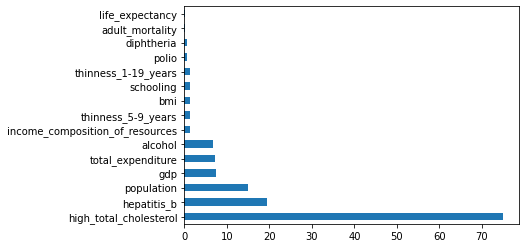

In [ ]:
missing = missing[missing > 0]
missing.plot(kind='barh')

Percentage of missing values in each column

In [ ]:
missing

high_total_cholesterol             75.019275
hepatitis_b                        19.352352
population                         15.034695
gdp                                 7.517348
total_expenditure                   7.324595
alcohol                             6.669237
income_composition_of_resources     1.272167
thinness_5-9_years                  1.233616
bmi                                 1.233616
schooling                           1.233616
thinness_1-19_years                 1.233616
polio                               0.655359
diphtheria                          0.655359
adult_mortality                     0.077101
life_expectancy                     0.077101
dtype: float64

Dealing with NULL values: interpolation / imputation?



Find out which countries have 'population' data missing for all years (to be added manually)

In [ ]:
#df.drop(columns=['high_total_cholesterol'], axis=1, inplace=True)
import math
df.isnull().sum()
#df.drop(columns=['hepatitis_b'], axis=1, inplace=True)
i=0
countries =  df['country'].unique()
countries
dict1 = dict()
for index, row in df.iterrows():
    country = row['country']
    if math.isnan(row['population']):
        if country not in dict1.keys():
            dict1[country] = 1
        else:
            dict1[country] = dict1[country]+1 
        
        
dict1

{'Antigua and Barbuda': 16,
 'Bahamas': 16,
 'Bahrain': 16,
 'Barbados': 16,
 'Congo': 16,
 'Cuba': 16,
 'Czechia': 16,
 'Dominica': 1,
 'Egypt': 16,
 'Eritrea': 4,
 'Gambia': 16,
 'Grenada': 16,
 'Kuwait': 16,
 'Kyrgyzstan': 16,
 'Libya': 16,
 'Marshall Islands': 1,
 'New Zealand': 16,
 'Oman': 16,
 'Qatar': 16,
 'Saint Lucia': 16,
 'Saint Vincent and the Grenadines': 16,
 'Saudi Arabia': 16,
 'Singapore': 16,
 'Slovakia': 16,
 'Somalia': 16,
 'United Arab Emirates': 16,
 'Yemen': 16}

In [ ]:
values = df['country'].value_counts()
print(values)
#Drop Marshall Islands and Dominica @Kapasi
#Manually impute populations for each country that doesn't have populations; Take 2000, 2005, 2010, 2015 populaion data from Google, 
#impute it python me hi, and interpolate other years's ke values from those. All the best. ***** ****.

Central African Republic    16
Afghanistan                 16
Qatar                       16
Malaysia                    16
Nicaragua                   16
                            ..
Haiti                       16
Lithuania                   16
Djibouti                    16
Marshall Islands             1
Dominica                     1
Name: country, Length: 164, dtype: int64


How many columns (datatypes) are numeric?

In [ ]:
numeric = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric_columns_df = df.select_dtypes(include = numeric)
len(numeric_columns_df.columns)

49

Outlier analysis

In [ ]:
# Calculate number of outliers and its percentage in each variable using Tukey's method.

for field in df.columns[3:]:
    q25, q75 = np.percentile(df[field], [25 ,75])
    iqr = q75 - q25

    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    print("# of outliers, % of {} : {} and {}".format(field, len((np.where((df[field] > max_val) | (df[field] < min_val))[0])),len((np.where((df[field] > max_val) | (df[field] < min_val))[0]))*100/1987))

# of outliers, % of life_expectancy : 0 and 0.0
# of outliers, % of adult_mortality : 0 and 0.0
# of outliers, % of infant_deaths : 278 and 13.990941117262205
# of outliers, % of alcohol : 0 and 0.0
# of outliers, % of percentage_expenditure : 346 and 17.413185707096126
# of outliers, % of hepatitis_b : 0 and 0.0
# of outliers, % of measles : 483 and 24.30800201308505
# of outliers, % of bmi : 0 and 0.0
# of outliers, % of under-five_deaths : 346 and 17.413185707096126
# of outliers, % of polio : 0 and 0.0
# of outliers, % of total_expenditure : 0 and 0.0
# of outliers, % of diphtheria : 0 and 0.0
# of outliers, % of hiv/aids : 488 and 24.55963764469049
# of outliers, % of gdp : 0 and 0.0
# of outliers, % of population : 0 and 0.0
# of outliers, % of thinness_1-19_years : 0 and 0.0
# of outliers, % of thinness_5-9_years : 0 and 0.0
# of outliers, % of income_composition_of_resources : 0 and 0.0
# of outliers, % of schooling : 0 and 0.0
# of outliers, % of unsafe_water_source : 377 and 

In [ ]:
df.columns

Index(['country', 'year', 'status', 'life_expectancy', 'adult_mortality',
       'infant_deaths', 'alcohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure',
       'diphtheria', 'hiv/aids', 'gdp', 'population', 'thinness_1-19_years',
       'thinness_5-9_years', 'income_composition_of_resources', 'schooling',
       'unsafe_water_source', 'unsafe_sanitation',
       'no_access_to_handwashing_facility',
       'household_air_pollution_from_solid_fuels',
       'non-exclusive_breastfeeding', 'discontinued_breastfeeding',
       'child_wasting', 'child_stunting', 'low_birth_weight_for_gestation',
       'secondhand_smoke', 'alcohol_use', 'drug_use', 'diet_low_in_fruits',
       'diet_low_in_vegetables', 'unsafe_sex', 'low_physical_activity',
       'high_fasting_plasma_glucose', 'high_total_cholesterol',
       'high_body-mass_index', 'high_systolic_blood_pressure', 'smoking',
       'iron_deficiency', 'vitamin_a_deficie

In [ ]:
df['bmi'].isna().sum()
#df['adult_mortality'] = df['adult_mortality'].replace(0, np.nan)
#df['adult_mortality'].isna().sum()

32

In [ ]:
df.describe()

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling,unsafe_water_source,unsafe_sanitation,no_access_to_handwashing_facility,household_air_pollution_from_solid_fuels,non-exclusive_breastfeeding,discontinued_breastfeeding,child_wasting,child_stunting,low_birth_weight_for_gestation,secondhand_smoke,alcohol_use,drug_use,diet_low_in_fruits,diet_low_in_vegetables,unsafe_sex,low_physical_activity,high_fasting_plasma_glucose,high_total_cholesterol,high_body-mass_index,high_systolic_blood_pressure,smoking,iron_deficiency,vitamin_a_deficiency,low_bone_mineral_density,air_pollution,outdoor_air_pollution,diet_high_in_sodium,diet_low_in_whole_grains,diet_low_in_nuts_and_seeds
count,2594.000000,2592.000000,2592.000000,2594.000000,2421.000000,2594.000000,2092.000000,2594.000000,2562.000000,2594.000000,2577.000000,2404.000000,2577.000000,2594.000000,2399.000000,2.204000e+03,2562.000000,2562.000000,2561.000000,2562.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,2594.000000,648.000000,2594.000000,2.594000e+03,2.594000e+03,2594.000000,2594.000000,2594.000000,2.594000e+03,2.594000e+03,2.594000e+03,2594.000000,2594.000000
mean,2007.504241,69.317554,163.900077,30.936777,4.647109,822.845334,81.027247,2315.411334,38.606987,43.008867,82.452852,5.908049,82.618937,1.669237,7554.093394,1.273630e+07,4.806753,4.838134,0.627909,12.001366,8782.996135,6375.448514,5085.638969,11278.783220,1468.546164,95.320970,10121.067520,2679.560003,8192.350449,6175.786391,13005.468202,2082.789232,11660.658228,7133.059341,8218.505706,5001.610264,26002.768601,17829.955454,16685.883768,4.376735e+04,3.275525e+04,497.923030,2641.205700,1296.485551,2.568389e+04,1.525823e+04,1.416482e+04,13442.422907,8794.024937
std,4.611412,9.570416,124.353841,124.083555,4.092943,2096.688974,24.960681,10886.460858,19.921293,168.702668,23.543673,2.357749,23.483837,4.560133,14406.633629,6.172264e+07,4.469820,4.553659,0.214279,3.438172,53441.249997,39320.287689,27367.970161,54883.996996,6079.616766,389.946097,42483.111177,13077.968303,33417.551178,31843.286763,56740.888209,8883.325901,57898.387312,29193.365538,27079.333140,17797.821062,84239.209332,63520.704958,51313.245431,1.783114e+05,1.568866e+05,2620.296488,12180.022512,6506.138623,1.274432e+05,8.284735e+04,1.004244e+05,57306.509605,33453.498590
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,1.400000,0.000000,3.000000,1.100000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000,0.038591,0.045326,0.476952,0.021216,0.066042,0.002848,0.634423,0.016245,1.947360,5.208804,-254.672153,2.703863,5.173118,0.776438,5.230744,9.585234,55.420550,26.852659,41.791707,7.995287e+01,2.973595e+01,0.018049,0.026281,0.478305,2.849307e+01,8.270000e+00,1.041593e+01,24.370348,19.114424
25%,2004.000000,63.000000,72.000000,0.000000,0.850000,13.322781,77.000000,0.000000,19.500000,0.000000,77.000000,4.260000,78.000000,0.100000,462.502219,2.148080e+05,1.600000,1.600000,0.486000,10.000000,8.888900,4.378088,14.923870,75.185795,3.802653,0.218983,33.577722,1.334932,125.602948,257.485513,347.379924,107.548893,491.103356,362.383566,138.220138,249.075032,2029.986338,833.110013,1188.640410,2.434114e+03,1.268413e+03,1.871014,1.493423,39.752476,9.652181e+02,5.460550e+02,3.703645e+02,759.714507,531.435365
50%,2008.000000,72.200000,143.500000,3.000000,3.850000,89.464230,92.000000,14.500000,44.050000,3.000000,93.000000,5.800000,93.000000,0.100000,1774.336730,1.428540e+06,3.300000,3.300000,0.683000,12.400000,128.119656,80.032544,149.073047,753.235819,45.485091,2.853525,334.968901,35.169743,672.243553,860.481103,2054.493348,359.630343,1920.972432,1341.416097,664.282702,875.70

In [ ]:
df['bmi'].min(), df['bmi'].max()

(1.4, 81.6)

Winsorization: Squashes data according to specified percentile
Eg: All data above 95th percentile is made to be equal to the 95th percentile; All data below 5th percentile is made to be equal to the 5th percentile

Note: scipy.stats.sem acquired keyword 'nan_policy' in release 0.17.0, so code might throw error if you're using 0.16.0

In [ ]:
import scipy
scipy.stats.mstats.winsorize(df['bmi'], limits=(0.1, 0.4), inplace=True, nan_policy='omit')
df['bmi'].describe()

TypeError: ignored

##EDA and Visualisation

- Does investment directly correspond to Human development Index? Should countries that want to improve life expectancy or HDI increase investments?
- Do all predicting factors (dataset 1 data : until 'Schooling') really affect Life expectancy?
- Does schooling have an impact on life expectancy?
- Does high immunisation help prevent a significant number of child fatalities? Does it have an impact on Life expectancy?
- Are the main causes of death the same in countries with high and low GDP / Health investment?
- Are volumes of deaths caused by smoking / pollution / discontinued breastfeeding / diet and child stunting / child wasting correlated?
- Which factor has had the highest bearing on death across the world over the years?
- Is low physical activity more of a contributing factor towards deaths in developed countries or developing countries? Is it correlated with BMI?
- Have deaths due to Air pollution, smoking, alcohol increased (globally) from 2000 to 2015? Is it the same case in India?
- Have deaths due to deficiencies decreased over time?
- Have deaths due to diets low in fruits, vegetables, whole wheat and nuts decreased over time? Is this related to countries' GDP?
- How is population related to life expectancy?
- Top 5, bottom 5 countries in terms of life expectancy; where does India stand?

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
tempDf = df[['year','life_expectancy','gdp','adult_mortality','schooling','income_composition_of_resources','unsafe_sanitation','air_pollution']]
tempDf.head()

,year,life_expectancy,gdp,adult_mortality,schooling,income_composition_of_resources,unsafe_sanitation,air_pollution
0,2015,65.0,584.259210,263.0,10.1,0.479,3843.622727,26033.71841
1,2014,59.9,612.696514,271.0,10.0,0.476,4048.986437,26251.14460
2,2013,59.9,631.744976,268.0,9.9,0.470,4166.686083,26468.19931
3,2012,59.5,669.959000,272.0,9.8,0.463,4170.828020,26529.23052
4,2011,59.2,63.537231,275.0,9.5,0.454,4507.041694,27174.74431


In [ ]:
tempDf.corr()

,year,life_expectancy,gdp,adult_mortality,schooling,income_composition_of_resources,unsafe_sanitation,air_pollution
year,1.000000,0.167869,0.099173,-0.075925,0.202191,0.235497,-0.021526,0.002464
life_expectancy,0.167869,1.000000,0.463199,-0.695114,0.762076,0.740855,-0.135556,-0.012566
gdp,0.099173,0.463199,1.000000,-0.299583,0.449249,0.459545,-0.076140,-0.064553
adult_mortality,-0.075925,-0.695114,-0.299583,1.000000,-0.464461,-0.473690,0.044564,-0.039138
schooling,0.202191,0.762076,0.449249,-0.464461,1.000000,0.807278,-0.137452,-0.065050
income_composition_of_resources,0.235497,0.740855,0.459545,-0.473690,0.807278,1.000000,-0.109009,-0.024557
unsafe_sanitation,-0.021526,-0.135556,-0.076140,0.044564,-0.137452,-0.109009,1.000000,0.661653
air_pollution,0.002464,-0.012566,-0.064553,-0.039138,-0.065050,-0.024557,0.661653,1.000000


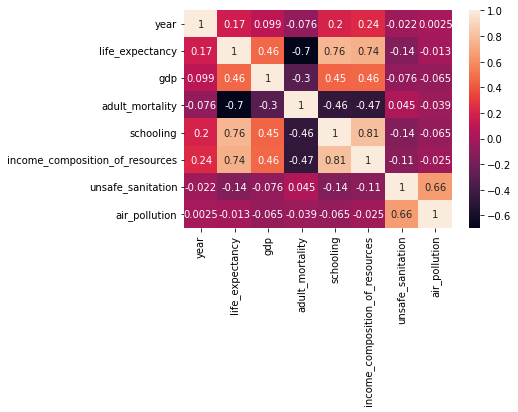

In [ ]:
dataplot = sns.heatmap(tempDf.corr(),annot=True)
plt.show()

In [ ]:
df.corr()

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling,unsafe_water_source,unsafe_sanitation,no_access_to_handwashing_facility,household_air_pollution_from_solid_fuels,non-exclusive_breastfeeding,discontinued_breastfeeding,child_wasting,child_stunting,low_birth_weight_for_gestation,secondhand_smoke,alcohol_use,drug_use,diet_low_in_fruits,diet_low_in_vegetables,unsafe_sex,low_physical_activity,high_fasting_plasma_glucose,high_total_cholesterol,high_body-mass_index,high_systolic_blood_pressure,smoking,iron_deficiency,vitamin_a_deficiency,low_bone_mineral_density,air_pollution,outdoor_air_pollution,diet_high_in_sodium,diet_low_in_whole_grains,diet_low_in_nuts_and_seeds
year,1.000000,0.167869,-0.075925,-0.037966,-0.047407,0.033362,0.095865,-0.091690,0.109163,-0.043241,0.089798,0.089016,0.142714,-0.144771,0.099173,0.018595,-0.040718,-0.047322,0.235497,0.202191,-0.014555,-0.021526,-0.018562,-0.020200,-0.045347,-0.042209,-0.051622,-0.062812,-0.027755,-0.000095,0.010428,0.013137,0.006925,0.004544,-0.018790,0.028661,0.033812,0.018391,0.049639,0.023277,0.006952,-0.037312,-0.064973,0.028564,0.002464,0.016878,0.012745,0.016918,0.024869
life_expectancy,0.167869,1.000000,-0.695114,-0.185664,0.420544,0.401866,0.248126,-0.149013,0.590964,-0.211877,0.478147,0.212259,0.495198,-0.574916,0.463199,-0.023701,-0.496194,-0.490014,0.740855,0.762076,-0.133511,-0.135556,-0.165836,-0.079806,-0.217311,-0.252253,-0.225104,-0.213302,-0.155291,0.023894,0.016654,0.018961,0.028355,0.017568,-0.345645,0.080801,0.054991,0.067953,0.096391,0.052813,0.068076,-0.148002,-0.226592,0.031744,-0.012566,0.034716,0.054239,0.040491,0.040910
adult_mortality,-0.075925,-0.695114,1.000000,0.066929,-0.214492,-0.256543,-0.153725,0.014211,-0.401249,0.082330,-0.282202,-0.110830,-0.274698,0.579411,-0.299583,-0.015767,0.319960,0.326064,-0.473690,-0.464461,0.043330,0.044564,0.063130,-0.000712,0.086637,0.115618,0.089560,0.075844,0.046823,-0.056977,-0.038370,-0.042509,-0.057352,-0.052047,0.303427,-0.084150,-0.070414,-0.056485,-0.084494,-0.068812,-0.080255,0.052253,0.088414,-0.061782,-0.039138,-0.064188,-0.065070,-0.064235,-0.060495
infant_deaths,-0.037966,-0.185664,0.066929,1.000000,-0.114973,-0.087973,-0.228853,0.520699,-0.228986,0.996604,-0.167979,-0.133259,-0.171653,0.027643,-0.110436,0.560503,0.483101,0.490436,-0.149957,-0.197940,0.951895,0.954621,0.963155,0.875386,0.967846,0.788923,0.969891,0.946970,0.992590,0.581675,0.685484,0.537127,0.553721,0.696233,0.553046,0.584616,0.689497,0.662943,0.491561,0.565376,0.491182,0.966696,0.956161,0.754926,0.740283,0.609359,0.261011,0.601419,0.692946
alcohol,-0.047407,0.420544,-0.214492,-0.114973,1.000000,0.362118,0.088025,-0.041118,0.339149,-0.111164,0.230257,0.294372,0.228700,-0.066830,0.366847,-0.048134,-0.424547,-0.411939,0.467885,0.566960,-0.080421,-0.079985,-0.078729,-0.096587,-0.094689,-0.048918,-0.097942,-0.079534,-0.121250,-0.039166,0.029253,0.011862,-0.032641,-0.039942,-0.003023,0.018920,-0.015521,-0.006686,0.038316,-0.004630,0.005563,-0.115137,-0.098703,-0.016717,-0.055091,-0.023609,-0.005037,-0.020943,-0.018003
percentage_expenditure,0.033362,0.401866,-0.256543,-0.087973,0.362118,1.000000,0.011148,-0.059082,0.242829,-0.090535,0.155455,0.207821,0.147582,-0.112821,0.901501,-0.026679,-0.265295,-0.266937,0.388736,0.394919,-0.060235,-0.059695,-0.067079,-0.073288,-0.087269,-0.086193,-0.085752,-0.075695,-0.085476,-0.046384,-0.032787,-0.031475,-0.042558,-0.043415,-0.084577,-0.011609,-0.023346,-0.011465,-0.017071,-0.029598,-0.014500,-0.069501,-0.080115,-0.013647,-0.052330,-0.035168,-0.026371,-0.038708,-0.038214
hepatitis_b,0.095865,0.248126,-0.153725,-0.228853,0.088025,0.011148,1.000000,-0.124624,0.163330,-0.238758,0.492519,0.061937,0.619126,-0.125530,0.077752,-0.131601,-0.131622,-0.139536,0.193070,0.221426,-0.195830,-0.200248,-0.210061,-0

In [ ]:
top_countries_by_lifeExpectancy = df.sort_values(by = 'life_expectancy', ascending = False)['country'].unique()[:10]
list(top_countries_by_lifeExpectancy)

['Belgium',
 'Italy',
 'Norway',
 'Germany',
 'Spain',
 'Sweden',
 'Finland',
 'France',
 'Portugal',
 'New Zealand']

In [ ]:
bottom_countries_by_lifeExpectancy = df.sort_values(by = 'life_expectancy')['country'].unique()[:10]
list(bottom_countries_by_lifeExpectancy)

['Haiti',
 'Sierra Leone',
 'Malawi',
 'Zambia',
 'Zimbabwe',
 'Lesotho',
 'Angola',
 'Eritrea',
 'Central African Republic',
 'Botswana']

In [ ]:
'United States of America' in list(df['country'])

False

In [ ]:
top_countries_by_BMI = df.sort_values(by = 'bmi', ascending = False)['country'].unique()[:10]
list(top_countries_by_BMI)

['Marshall Islands',
 'Kiribati',
 'Tonga',
 'Samoa',
 'Kuwait',
 'Malta',
 'Qatar',
 'Saudi Arabia',
 'New Zealand',
 'Canada']

In [ ]:
!pip install dataprep
from dataprep.eda import create_report

My Report
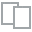
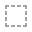
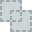
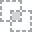
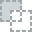
...
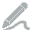
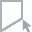
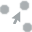
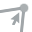
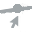

In [ ]:
report = create_report(df, title='My Report')
report